# Test the ReadSTAC class

In this Notebook, the methods of the ReadSTAC class are explored and tested. 

The main purposes and functions of the class are: 
1. Read a STAC API to obtain metadata
2. Download data using the ``stackstac`` library, allowing for direct further processing of the data as ``xarray.DataArray`` objects. With this approach, a small area of interest can be defined before downloading the data, making it more efficient and faster than downloading whole tiles. 
3. Downloading whole tiles as GeoTIFFs and VRTs. 

## Setup

In [2]:
import sys
sys.path.append('..')
from src.data.get_satellite_images import ReadSTAC

import matplotlib.pyplot as plt
# import skimage
# import seaborn as sns

## 1. Read STAC API to obtain metadata

In [3]:
# Option 1 (Default): Read from Planetary Computer STAC API
api_url="https://planetarycomputer.microsoft.com/api/stac/v1"
bands = ['B04', 'B03', 'B02']
bands_landsat = ['red', 'green', 'blue']

# # Option 2: Read from AWS STAC API
# api_url="https://earth-search.aws.element84.com/v1"
# bands = ['red', 'green', 'blue']

stac_reader = ReadSTAC(api_url=api_url)

# check available items
items = stac_reader.get_items(
    location = [-50.18255000697929, -6.054643555224412],
    buffer=10,
    timerange='2020-01-01/2020-12-30',
    max_cloud_cover=10
)
items

28 Items found.


Loading a particular item, either the least cloudy or the most recent in the area of interest:

In [4]:
least_cloudy_item = stac_reader.filter_item(items, "least_cloudy")
most_recent_item = stac_reader.filter_item(items, "most_recent")

Found 2 unique tile ids.
Choosing the best 1 items.For unique tile 22MFU, choosing ['S2B_MSIL2A_20200729T134219_R124_T22MFU_20200818T015550'] from [datetime.date(2020, 7, 29)] with [0.016453]% cloud cover
Choosing the best 1 items.For unique tile 22MEU, choosing ['S2A_MSIL2A_20200614T134221_R124_T22MEU_20200827T082613'] from [datetime.date(2020, 6, 14)] with [0.008988]% cloud cover
Found 2 unique tile ids.
Choosing the best 1 items.For unique tile 22MFU, choosing ['S2B_MSIL2A_20200917T134209_R124_T22MFU_20200921T060305'] from [datetime.date(2020, 9, 17)] with [0.920518]% cloud cover
Choosing the best 1 items.For unique tile 22MEU, choosing ['S2B_MSIL2A_20200917T134209_R124_T22MEU_20200921T060242'] from [datetime.date(2020, 9, 17)] with [4.986651]% cloud cover


Preview the tile: 

In [5]:
# table, image = stac_reader.preview_item(least_cloudy_item[0])
# display(table)
# image.show()

## 2. Downloading data using the stackstac library
The stackstac library facilitates lazy-load, i.e. the data is only loaded at the end when requested. 

### Get the stack item of only the area of interest defined in the class above

In [6]:
stack = stac_reader.get_stack(items, filter_by="least_cloudy", bands=bands, resolution=10, take_best_n=1)
stack

Loading stack...
Found 2 unique tile ids.
Choosing the best 1 items.For unique tile 22MFU, choosing ['S2B_MSIL2A_20200729T134219_R124_T22MFU_20200818T015550'] from [datetime.date(2020, 7, 29)] with [0.016453]% cloud cover
Choosing the best 1 items.For unique tile 22MEU, choosing ['S2A_MSIL2A_20200614T134221_R124_T22MEU_20200827T082613'] from [datetime.date(2020, 6, 14)] with [0.008988]% cloud cover
Returning stack from single S2 image with ID: S2A_MSIL2A_20200614T134221_R124_T22MEU_20200827T082613


<xarray.DataArray 'stackstac-f1edab06b6fb05e371f27de7c58cd9c7' (band: 3,
                                                                y: 1990, x: 2009)> Size: 48MB
dask.array<mosaic-aggregate, shape=(3, 1990, 2009), dtype=float32, chunksize=(1, 1024, 1024), chunktype=numpy.ndarray>
Coordinates: (12/46)
  * band                                     (band) <U3 36B 'B04' 'B03' 'B02'
  * x                                        (x) float64 16kB 5.804e+05 ... 6...
  * y                                        (y) float64 16kB 9.341e+06 ... 9...
    s2:granule_id                            <U62 248B 'S2A_OPER_MSI_L2A_TL_E...
    s2:mean_solar_zenith                     float64 8B 37.81
    s2:medium_proba_clouds_percentage        float64 8B 0.007331
    ...                                       ...
    gsd                                      float64 8B 10.0
    common_name                              (band) <U5 60B 'red' 'green' 'blue'
    center_wavelength                        (band) float64 24B 0.665 0.56 0.49
    full_width_half_max                      (band) float64 24B 0.038 ... 0.098
    epsg                                     int64 8B 32722
    s2_tile_id                               <U54 216B 'S2A_MSIL2A_20200614T1...
Attributes:
    spec:        RasterSpec(epsg=32722, bounds=(580420, 9320740, 600510, 9340...
    crs:         epsg:32722
    transform:   | 10.00, 0.00, 580420.00|\n| 0.00,-10.00, 9340640.00|\n| 0.0...
    resolution:  10
    s2_tile_id:  S2A_MSIL2A_20200614T134221_R124_T22MEU_20200827T082613

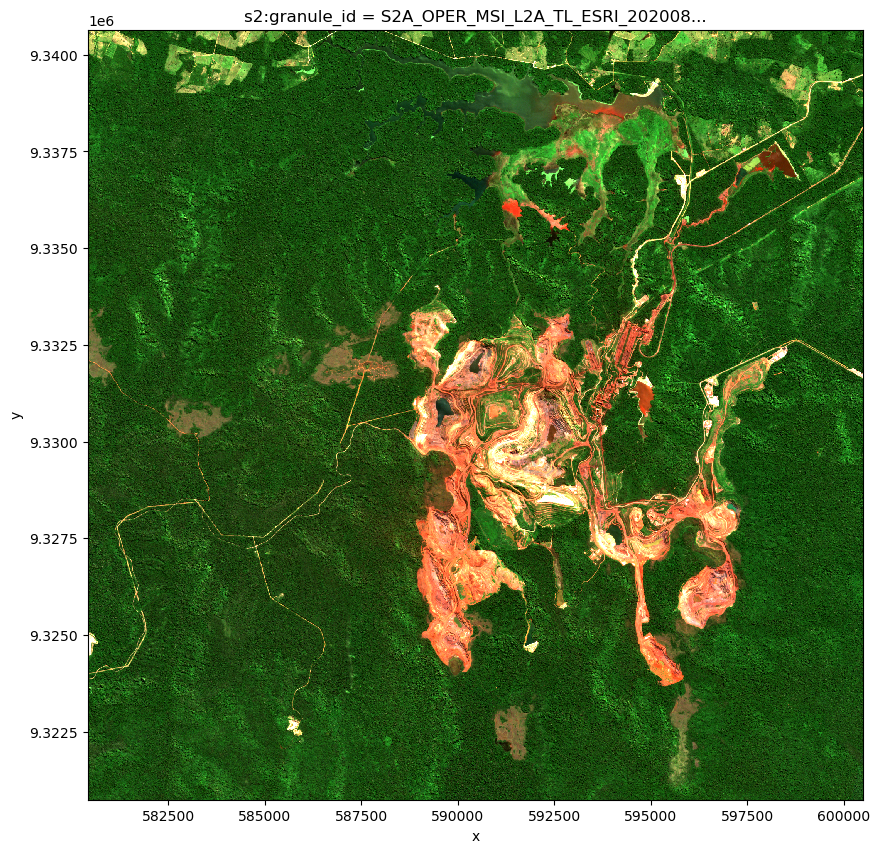

In [7]:
stac_reader.display_stack_as_image(stack)

### Enhance contrast with contrast stretching

In [8]:
stack_stretched = stac_reader.stretch_contrast_stack(stack)

Stretching contrast...


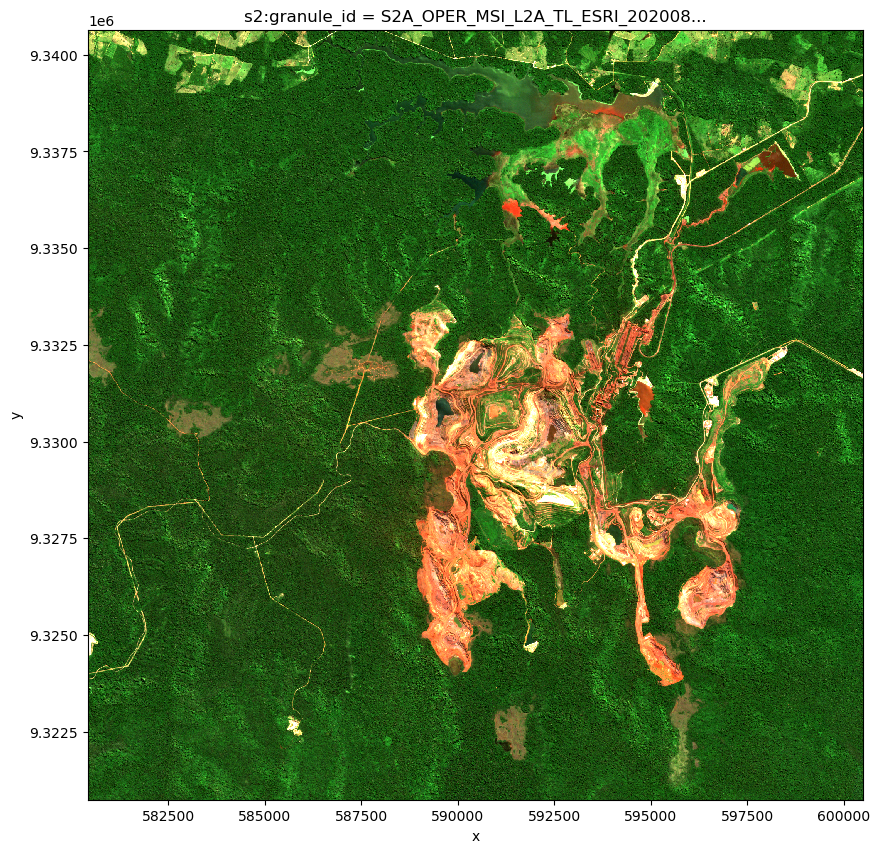

In [9]:
stac_reader.display_stack_as_image(stack_stretched)

NameError: name 'sns' is not defined

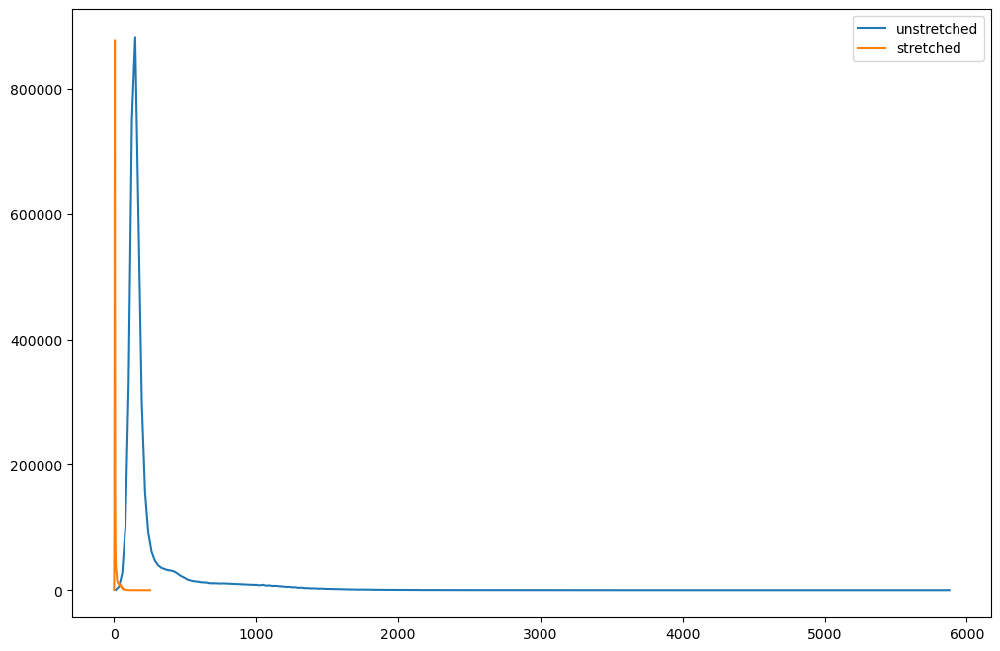

In [20]:
fig, ax = plt.subplots(figsize=(12, 8))

hist, bins = skimage.exposure.histogram(stack.isel(band=0).data.compute())
ax.plot(bins, hist, label="unstretched")

hist, bins = skimage.exposure.histogram(stack_stretched.isel(band=0).data)
ax.plot(bins, hist, label="stretched")

plt.legend()
sns.despine()

We can now save the stack as a GeoTIFF, to be used further downstream. 

In [24]:
stac_reader.save_stack_as_geotiff(stack_stretched, "s2")

Saving stack as GeoTIFF under: data/interim/s2.tif


'data/interim/s2.tif'

## Check selecting the tile with the largest overlap

In [3]:
# check available items using a large buffer of 50 km
items = stac_reader.get_items(
    location = [-50.18255000697929, -6.054643555224412],
    buffer=50,
    timerange='2020-01-01/2020-12-30',
    max_cloud_cover=10
)

49 Items found.


In [4]:
least_cloudy_item = stac_reader.filter_item(items, "least_cloudy")

Found 4 unique tile ids.
Choosing the best 1 items.For unique tile 224_065, choosing ['LE07_L2SP_224065_20200830_02_T1'] from [datetime.date(2020, 8, 30)] with [0.0]% cloud cover
Choosing the best 1 items.For unique tile 224_064, choosing ['LE07_L2SP_224064_20200814_02_T1'] from [datetime.date(2020, 8, 14)] with [0.0]% cloud cover
Choosing the best 1 items.For unique tile 223_065, choosing ['LC08_L2SP_223065_20200916_02_T1'] from [datetime.date(2020, 9, 16)] with [0.0]% cloud cover
Choosing the best 1 items.For unique tile 223_064, choosing ['LE07_L2SP_223064_20200908_02_T1'] from [datetime.date(2020, 9, 8)] with [0.0]% cloud cover


In [5]:
stac_reader.preview_tile_outlines(least_cloudy_item)


Map(center=[-6.054643555224412, -50.18255000697929], controls=(ZoomControl(options=['position', 'zoom_in_text'…

In [8]:
# select only the tile with the largest largest overlap 
largest_overlap_item = stac_reader.select_item_w_largest_overlap(items)

In [9]:
stac_reader.preview_tile_outlines(largest_overlap_item)


Map(center=[-6.054643555224412, -50.18255000697929], controls=(ZoomControl(options=['position', 'zoom_in_text'…

# Check loading item from item name 